In [1]:
import matplotlib.pyplot as plt
import numpy as np

import sys
sys.path.insert(0, '..')
from rowrectifier.rowrectifier import RowRectifier

# Global options

save_images = True

# Load an image and rectify with polygon matching

Text(0.5, 1.0, '4. Rectified result')

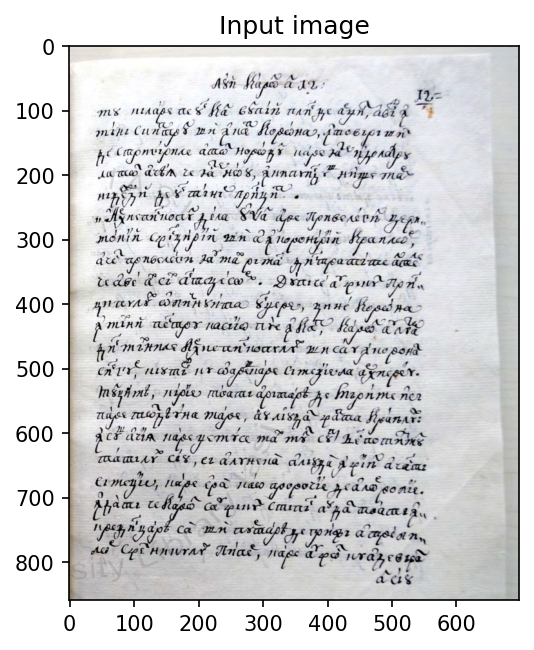

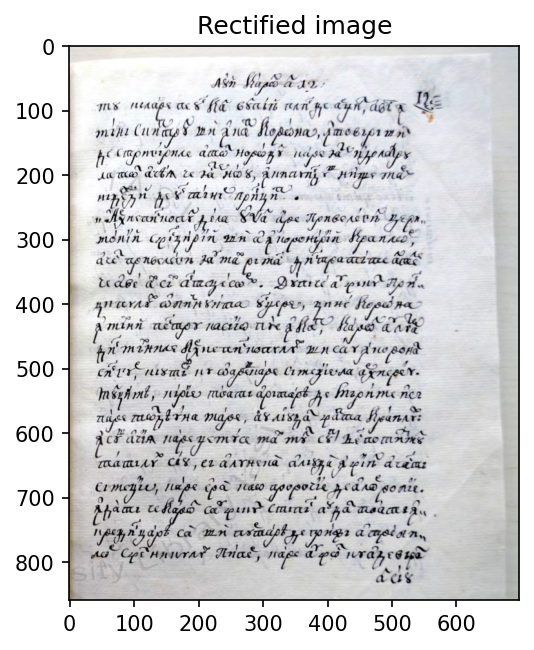

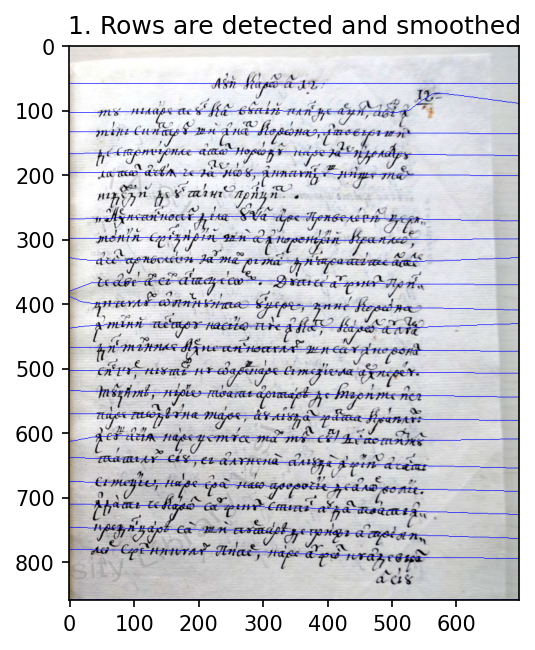

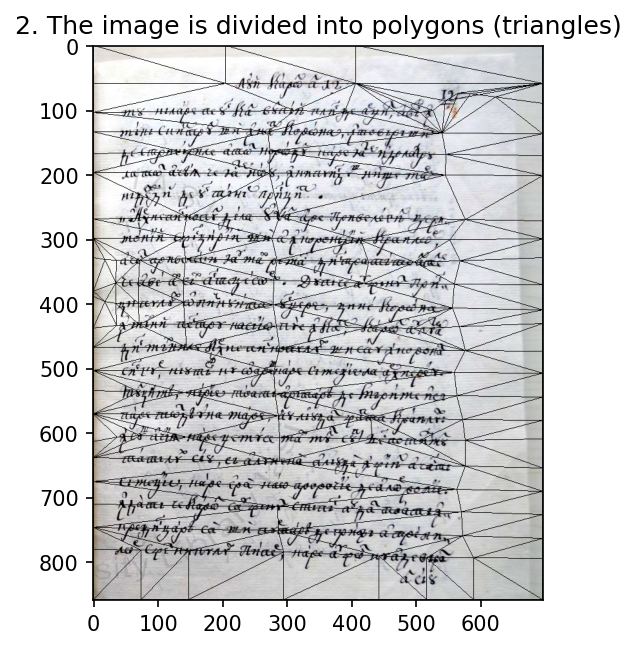

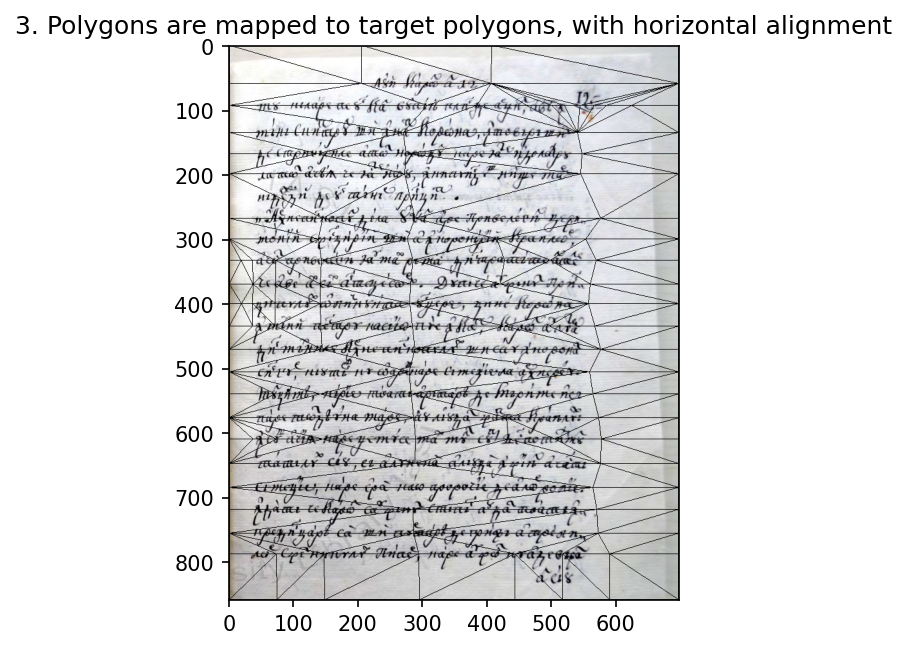

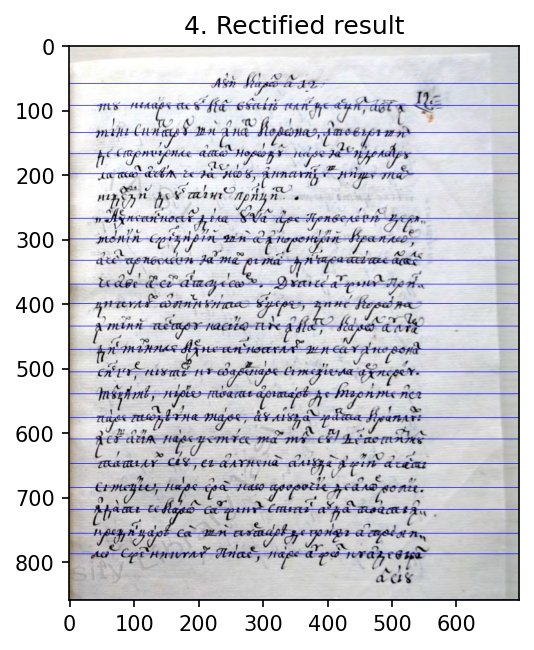

In [2]:
# Load image
#I = plt.imread("../samples/Rows.png")
I = plt.imread("../samples/Curved rows/Cropped/bcu-iasi-ms-iv-5-istoria-craiin-limba-franceza-1792-254-f-15-pagina-2.png")

# Rectify
rr = RowRectifier(method="poly", smoothing_method='univariate_spline', s=None, n_poly_sides=3)
rr.fit(I)
Iout1, Isrc_polys, Isrc_ridges, Idst_polys, Idst_ridges = rr.transform(I, return_intermediates=True)

# Plot input and output
plt.figure(dpi=150)
plt.imshow(I)
plt.title("Input image")
#---
plt.figure(dpi=150)
plt.imshow(Iout1)
if save_images: plt.savefig('img_poly_rectified.png', bbox_inches='tight')
plt.title("Rectified image")

# Plot intermediate figs
plt.figure(dpi=150)
plt.imshow(Isrc_ridges/255)
if save_images: plt.savefig('img_poly_srcridges.png', bbox_inches='tight')
plt.title("1. Rows are detected and smoothed")
#--
plt.figure(dpi=150)
plt.imshow(Isrc_polys/255)
if save_images: plt.savefig('img_poly_srctriangles.png', bbox_inches='tight')
plt.title("2. The image is divided into polygons (triangles)")
#--
plt.figure(dpi=150)
plt.imshow(Idst_polys/255)
if save_images: plt.savefig('img_poly_dsttriangles.png', bbox_inches='tight')
plt.title("3. Polygons are mapped to target polygons, with horizontal alignment")
#--
plt.figure(dpi=150)
plt.imshow(Idst_ridges/255)
if save_images: plt.savefig('img_poly_dstridges.png', bbox_inches='tight')
plt.title("4. Rectified result")


# Rectify with spline approximation and remapping

Text(0.5, 1.0, '5. Rectified result')

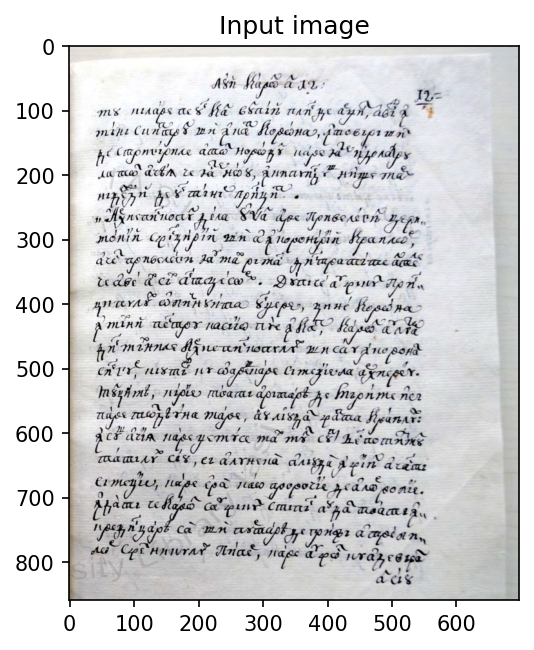

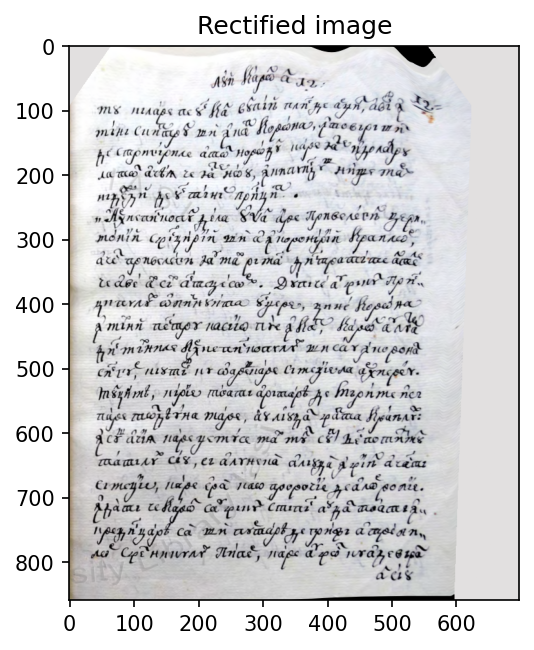

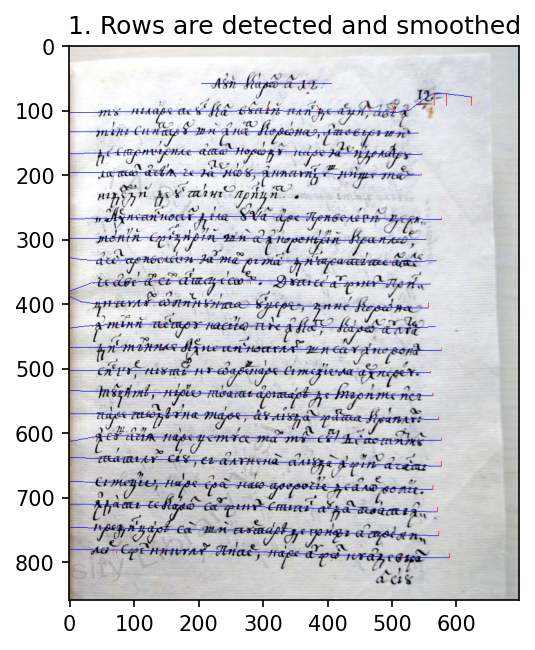

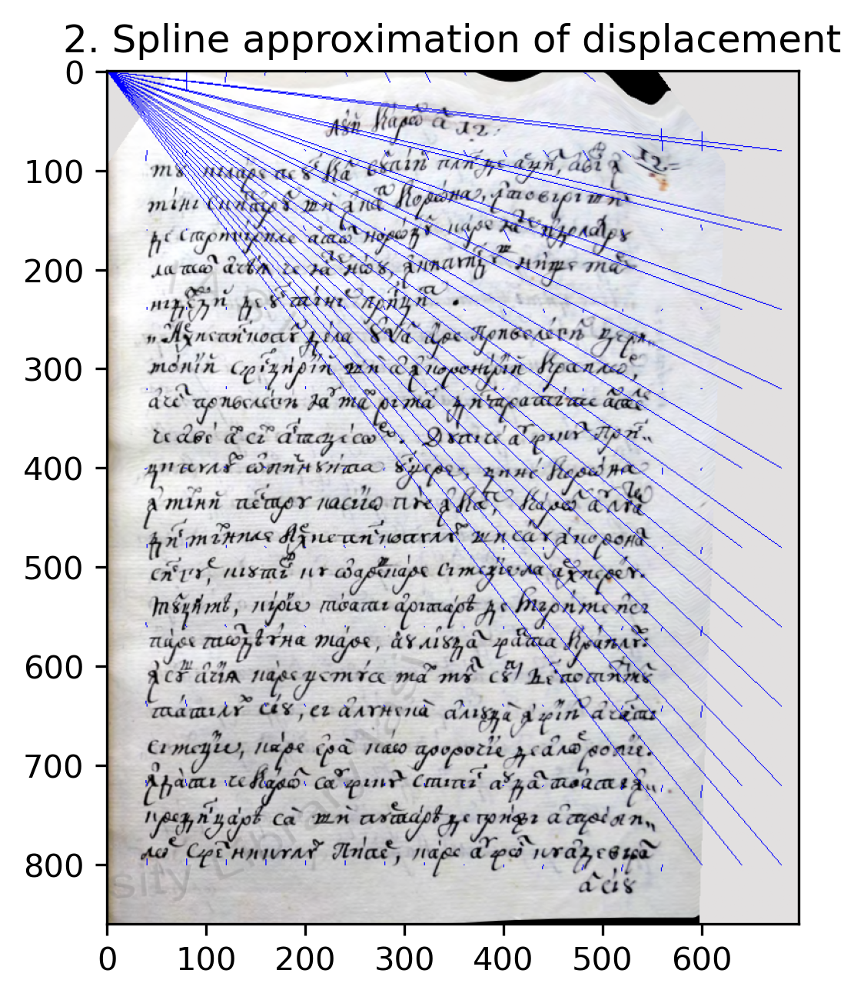

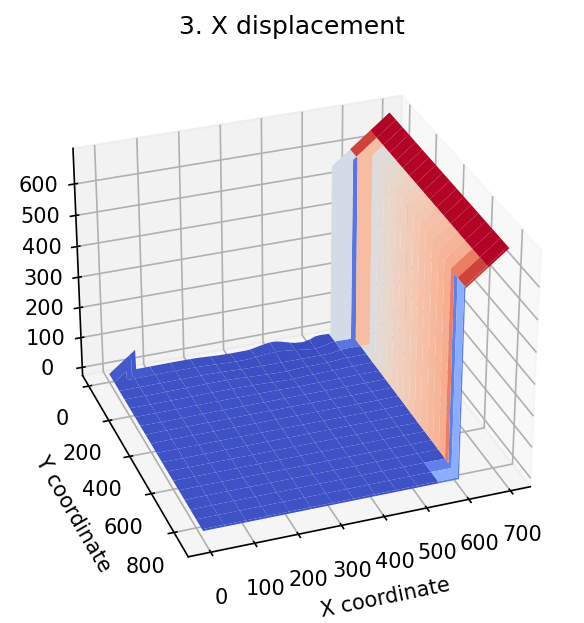

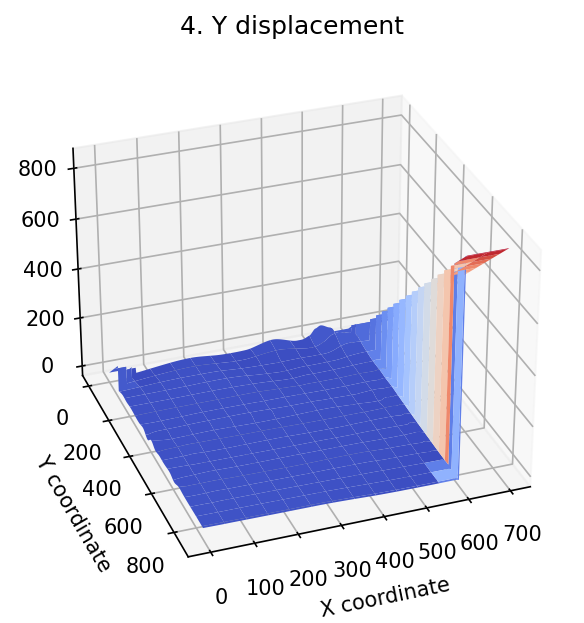

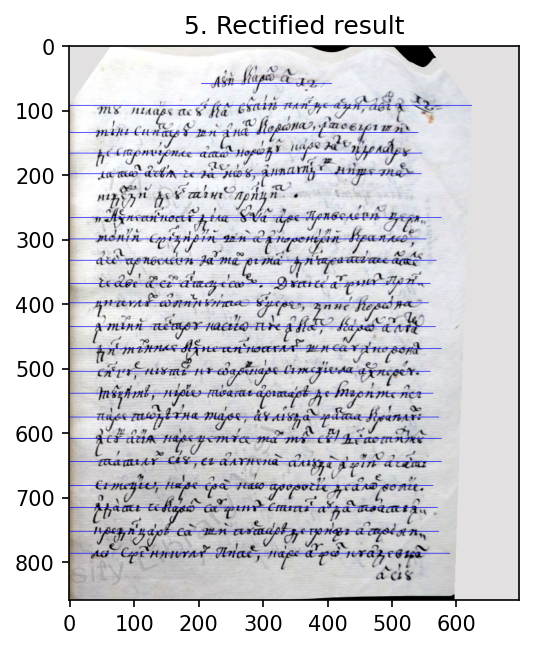

In [3]:
# # Load image
# I = plt.imread("../samples/Rows.png")

# Rectify
rr = RowRectifier(method="map", smoothing_method="univariate_spline")
rr.fit(I)
Iout2, Isrc_ridges, Idst_ridges, Idispl, map_x, map_y = rr.transform(I, return_intermediates=True)

# Plot input and output
plt.figure(dpi=150)
plt.imshow(I)
plt.title("Input image")
#--
plt.figure(dpi=150)
plt.imshow(Iout2)
if save_images: plt.savefig('img_map_rectified.png', bbox_inches='tight')
plt.title("Rectified image")

# Plot intermediate figs
plt.figure(dpi=150)
plt.imshow(Isrc_ridges/255)
if save_images: plt.savefig('img_map_srcridges.png', bbox_inches='tight')
plt.title("1. Rows are detected and smoothed")
#--
plt.figure(dpi=300)
plt.imshow(Idispl/255)
if save_images: plt.savefig('img_map_displacements.png', bbox_inches='tight')
plt.title("2. Spline approximation of displacement")

# Use same limits
minmin = np.min([np.min(map_x), np.min(map_y)])
maxmax = np.max([np.max(map_x), np.max(map_y)])
#---
ax = plt.figure(dpi=150).add_subplot(111, projection='3d')
xg, yg = np.meshgrid(np.arange(map_x.shape[1]), np.arange(map_x.shape[0]))
ax.view_init(elev=30, azim=-110, roll=0)
ax.plot_surface(xg, yg, -map_x, cmap='coolwarm', rstride=50, cstride=50)
ax.invert_yaxis()
#ax.set_zlim3d(-2,2)
plt.xlabel('X coordinate')
plt.ylabel('Y coordinate')
if save_images: plt.savefig('img_map_Xdispl.png', bbox_inches='tight')
plt.title("3. X displacement")
#--
ax = plt.figure(dpi=150).add_subplot(111, projection='3d')
ax.view_init(elev=30, azim=-110, roll=0)
ax.plot_surface(xg, yg, -map_y, cmap='coolwarm', rstride=50, cstride=50)
ax.invert_yaxis()
#ax.set_zlim3d(-100,100)
plt.xlabel('X coordinate')
plt.ylabel('Y coordinate')
if save_images: plt.savefig('img_map_Ydispl.png', bbox_inches='tight')
plt.title("4. Y displacement")
#--
plt.figure(dpi=150)
plt.imshow(Idst_ridges/255)
if save_images: plt.savefig('img_map_dstridges.png', bbox_inches='tight')
plt.title("5. Rectified result")

# Comparison between methods

Text(0.5, 1.0, 'Rectification with splines')

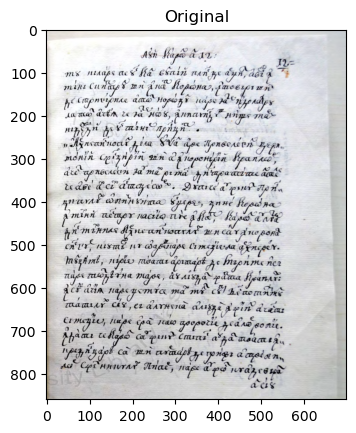

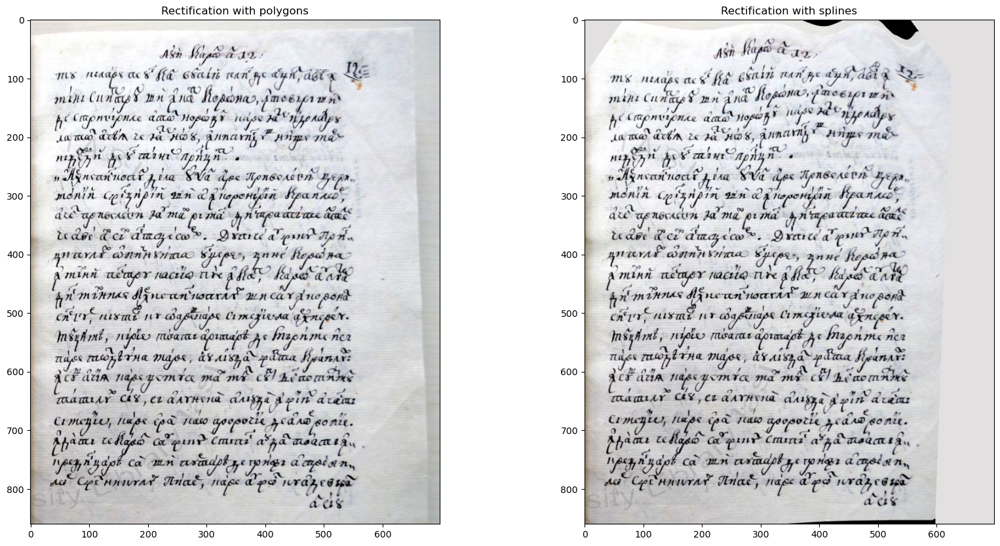

In [4]:
plt.figure()
plt.imshow(I)
plt.title("Original")

plt.figure(figsize=(20,10))
#---
plt.subplot(1, 2, 1)
plt.imshow(Iout1)
plt.title("Rectification with polygons")
#---
plt.subplot(1, 2, 2)
plt.imshow(Iout2)
plt.title("Rectification with splines")


# The preprocessing steps

Text(0.5, 1.0, '5. Extract ridges (follow the white bands) on the filtered image')

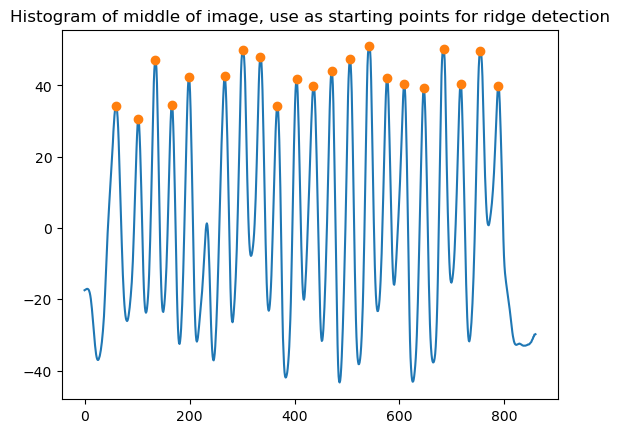

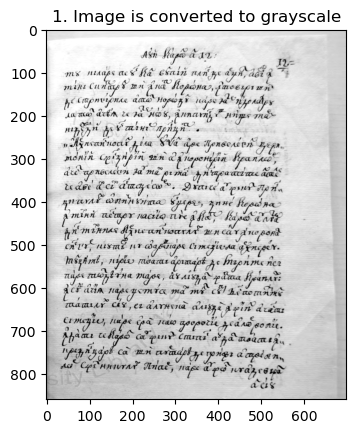

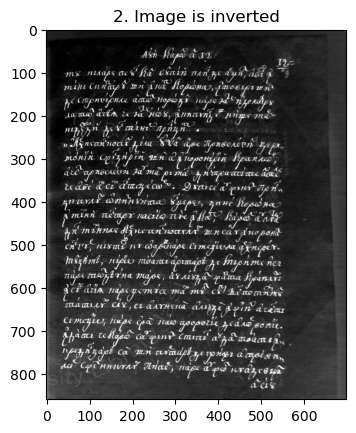

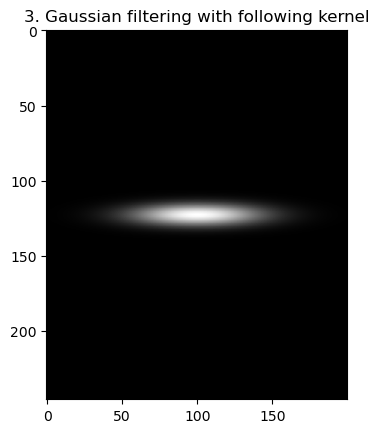

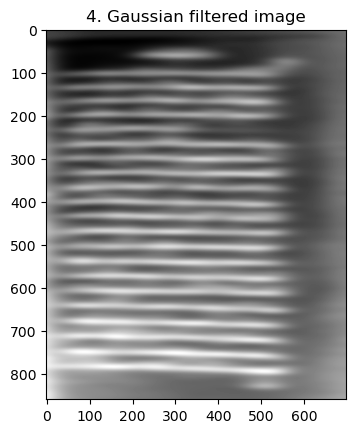

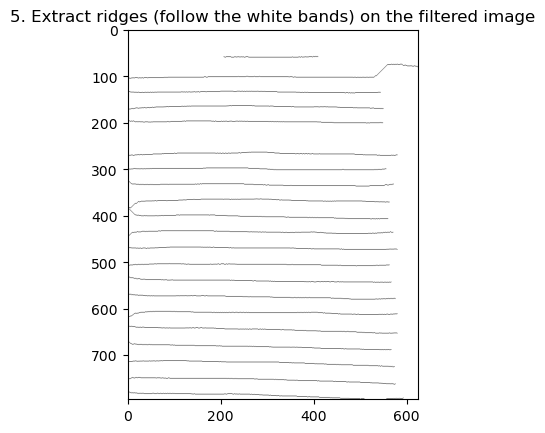

In [5]:
# Call rectify again
rr = RowRectifier(method="poly", smoothing_method='univariate_spline', s=None, n_poly_sides=3)
Ifiltridges, Ifilt, Iinv, Igray, Ikernel, Ipeaks = rr.fit(I, return_intermediates=True)

if save_images: plt.savefig('img_preproc_histogram.png', bbox_inches='tight')
plt.title('Histogram of middle of image, use as starting points for ridge detection')

plt.figure()
plt.imshow(Igray, cmap='gray')
if save_images: plt.savefig('img_preproc_grayscale.png', bbox_inches='tight')
plt.title("1. Image is converted to grayscale")
#---
plt.figure()
plt.imshow(Iinv, cmap='gray')
if save_images: plt.savefig('img_preproc_inverted.png', bbox_inches='tight')
plt.title("2. Image is inverted")
#---
plt.figure()
plt.imshow(Ikernel, cmap='gray')
if save_images: plt.savefig('img_preproc_kernel.png', bbox_inches='tight')
plt.title("3. Gaussian filtering with following kernel")
#---
plt.figure()
plt.imshow(Ifilt, cmap='gray')
if save_images: plt.savefig('img_preproc_filtered.png', bbox_inches='tight')
plt.title("4. Gaussian filtered image")
#---
plt.figure()
plt.imshow(Ifiltridges, cmap='gray')
if save_images: plt.savefig('img_preproc_ridges.png', bbox_inches='tight')
plt.title("5. Extract ridges (follow the white bands) on the filtered image")
